# Passing information using Memory.

When we needs to share information, we use the memory to pass it to all parallel threads.

We have to take care how we use the memory access, and the scope where the variables exists, and, in the case of Python, how the interpreter handles it.

In Python, we wil use the global variables defined in the modules, to store the common information which will be used by all tasks.

One important thing: The use of this memory information MUST be used n a Read Only policy, to avoid any kind of hazzards. *Note: Python does not implements a Read Only policy, is a Programmer way to programming*

* _Read Only_ memory access to the shared data. In this case, we can call the global variable from our distributed code

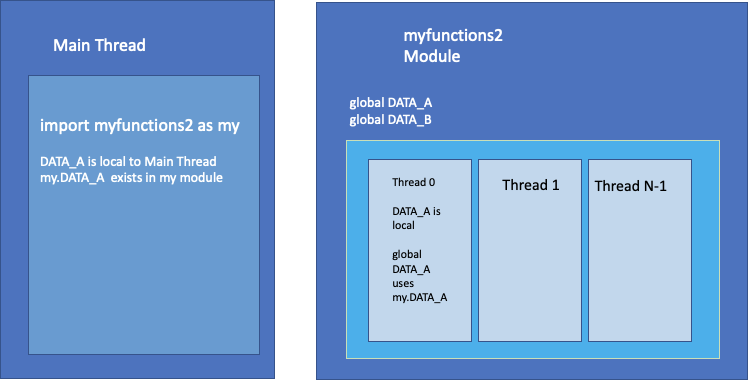

In [3]:
%matplotlib inline
import multiprocessing as mp
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cProfile

In [4]:
import myfunctions2 as my

Everytime you make changes in the python file *myfunctions.py*, you have to reload them, to update the changes.

In [5]:
import importlib

In [6]:
importlib.reload(my)

<module 'myfunctions2' from 'C:\\Users\\Dimi\\Massive Computing\\Session5_2022 (1)\\Session5_2022\\myfunctions2.py'>

Now, we have to define the number of parallel processes

In [7]:
NUMCORES=8

## Baseline: sequential matrix multiplication:

Here we will implements the sequential matrix multiplication. Remember, to calculate a matrix multiplication:
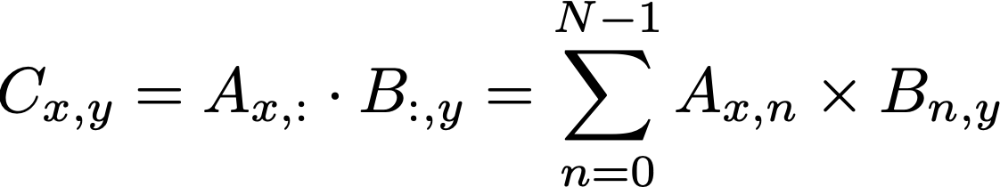

Where A,B are matrices of size: For A, M rows, N columns, for B N rows, P columns, C is the result matrix of size, MxP.

In [15]:
M=1000
N=500
P=750
matrix_A=np.random.rand(M,N)
matrix_B=np.random.rand(N,P)


Now, we will implements the function to multiply 2 matrices

In [8]:
def seq_mat_mult(A,B):
    (M,N)=A.shape
    (_,P)=B.shape
    C=np.zeros((M,P))
    for x in range(M):
        for y in range(P):
            accu=0
            for n in range(N):
                accu += A[x,n] * B[n,y]
            C[x,y] = accu
    return C

In [9]:
%%time
C = seq_mat_mult(matrix_A,matrix_B)

CPU times: total: 2min 21s
Wall time: 2min 22s


## First example: Implement a distributed matrix multiplication using shared memory (read only access policy)
We will create a 2 matrices and multiply thew two.
The distributed matrices multiplication distributes the rows of the first matrix, share the second matrix between processes, and calculate the new result row:
The steps will be:

* Define the global variables
* Define our distributed function
* Adapt our data to distribute they in the pool of process
* Create the distribute of process pool
* Execute and collect


Here we define our data

In [10]:
matrix_B.shape
my.init_second(matrix_B)

(500, 750)


We define a distributed parallel multiplication

In [11]:
#Here, we calculate the matrix_1 shape to adapt it to our parallel process
(rows,columns)=matrix_A.shape

In [36]:
#We can verify if our algorithm works in sequential order
for f in range(rows):
    v=matrix_A[f,:]
    c=my.parallel_matmul(v)
    print(c)

[129.65214846 117.81537977 120.29398052 117.17257541 124.39635129
 124.81087954 125.74332825 127.22721485 122.43785753 117.58183838
 121.11327861 119.34013419 122.65593597 119.43205076 119.33837001
 121.94366084 128.08027063 117.88808034 115.41099653 119.27296733
 125.06754181 124.97484809 128.44116126 122.20405151 118.84790515
 116.68389398 123.14347936 126.31974726 125.85908464 115.41794597
 127.6783323  123.40067697 128.03251994 122.84853506 123.55810196
 125.90046958 121.49614467 129.93888626 121.72563989 120.52628532
 121.2128335  115.82243493 130.5727067  115.40502774 123.14368592
 124.8165022  124.02871579 115.27293353 123.05317735 118.47184237
 123.71182421 126.49481288 125.05676525 123.50909911 130.57287234
 120.40211089 121.93430166 118.6144957  129.17424554 129.85573792
 129.26628334 125.11170151 119.13841984 125.25472183 120.6807386
 124.0161781  120.61609127 118.81282396 116.3428911  120.3879438
 124.48087183 118.35501584 119.38527239 121.82437761 124.31826445
 122.5198333

[133.85756853 121.8681393  127.40832884 116.30900523 129.88485554
 129.55196353 130.44512143 134.75427644 127.25245551 125.27971547
 130.54402197 123.03837282 121.55005231 131.34381682 124.88818072
 128.12835245 125.83643186 124.82208627 120.3235034  124.27165451
 132.7355437  128.38383209 128.04873959 126.7281227  125.2077348
 121.3658808  123.81417977 130.24761185 129.56467233 118.38370075
 134.01287454 128.21245118 134.15191296 129.47528011 129.52849951
 132.08656559 129.79435835 131.3236374  121.94901611 126.57717647
 126.29217803 123.05601784 134.82690545 121.46139098 132.52591681
 133.22392612 127.88283612 123.97233179 129.12935922 125.58523281
 128.12496595 134.48239587 125.92080616 127.4896788  135.01660195
 124.89153212 129.17690069 126.49495185 127.27739665 131.17281493
 133.99919646 132.7368781  122.26610575 125.66463649 124.66862437
 131.90865753 125.5730669  122.70469812 126.31355494 121.14232447
 128.04767728 124.37746532 118.89392732 122.69963564 129.76534625
 128.679196

[134.29047886 120.52888152 125.96293569 118.2326312  126.36262182
 129.97659428 132.56036619 128.40346976 126.37735221 123.62590615
 127.7147996  120.56369149 125.53715035 124.3313197  121.27374376
 126.32410448 127.68843512 125.33168688 117.98691799 124.54705553
 126.85972195 130.69648638 128.15681546 123.50811595 122.9111301
 117.71909829 124.24550964 132.22683848 131.87462452 115.9614961
 132.18883533 123.47811776 131.79656926 126.34539002 128.59400883
 130.20274303 129.83315545 129.50984038 121.70361523 125.33822512
 123.19206563 117.60962403 128.07505524 123.95696667 129.0684065
 126.93376873 122.88064335 119.37399505 123.16466911 121.52773785
 129.47966065 133.22838807 127.43848152 124.33704899 135.88127075
 122.66955696 123.55421972 122.73715401 126.50576597 130.11092555
 133.07207374 130.89001643 123.92543508 126.08542862 126.22517676
 127.13777308 121.10489216 124.59009136 123.64067787 122.71422042
 125.70384727 123.65273632 122.26363966 122.46468795 130.04600908
 128.51905204

[132.90654103 121.66662724 125.44278583 116.86947797 126.44637769
 128.81477705 130.11918447 126.86584542 126.64937298 124.3622209
 127.01759558 120.33346692 124.44483523 127.13659562 121.8323106
 125.16603482 125.32193797 127.60669669 118.34258201 127.14665527
 127.72717206 130.75214857 126.69503995 125.36625778 123.79552938
 119.72135927 125.41292789 129.27846569 129.74446865 118.42670666
 129.99095675 127.03341464 127.77542221 127.37958266 129.11249214
 128.50805965 130.62602636 128.70123188 124.72567477 124.28706021
 124.60388824 119.31798103 130.34031806 124.32059354 128.38389998
 127.40522064 125.20727848 116.58530561 127.44486465 121.99883677
 128.21872345 127.97665667 124.18839981 125.66498617 134.54594901
 124.29339797 124.20873108 129.01990146 127.11955686 131.53387303
 134.1973693  126.87031003 130.34037549 122.33922498 122.29405515
 127.13145448 122.86523855 120.09874416 123.28740621 124.31715209
 126.98184748 126.54610248 119.27268581 122.78037865 128.03445491
 126.4668700

[132.50389321 119.37309518 124.52054191 118.34075584 128.46630406
 129.12835726 129.01321784 126.40241326 122.23467594 123.76631988
 124.11102855 117.80278564 125.20220208 128.14404498 125.64750976
 124.36897876 121.76923931 125.3625108  122.86582554 125.17280544
 132.55616348 128.63331305 125.58935384 127.8547172  126.48301804
 117.6140225  124.03908665 128.75178959 127.92295071 117.49362656
 130.42667351 124.51512582 128.7630683  128.73450995 126.44546162
 133.96267363 126.28855463 130.14671632 123.96465395 125.2345131
 123.07535153 117.01865217 132.34444241 120.34479789 126.24370904
 127.86639517 121.96450036 118.40703552 125.48835484 119.30265806
 123.34219127 131.55566045 124.1980354  126.7613614  130.12969452
 123.48218407 124.79115776 125.57603188 123.27583085 132.63664739
 134.31070751 128.00392075 121.63155758 125.56187108 124.46825788
 131.41303706 123.28010318 123.85039733 122.71111062 124.58500518
 123.16136509 121.29799654 118.32396023 120.34779515 127.2768615
 125.2133967

[131.7589018  122.55890666 129.08328472 121.94388225 130.23919768
 131.68278806 134.70285041 129.26824162 128.75008703 128.59925088
 124.6727058  127.10724946 127.56604427 130.09320289 128.32979505
 130.45428983 124.49141721 132.14882135 125.38706842 130.08217694
 126.82434094 131.32221317 132.8783915  126.18663322 125.08516152
 119.37467567 134.2276138  131.15697192 132.12890043 120.0784978
 133.68124356 125.57213042 131.96739725 130.97703585 134.62304907
 132.32950386 132.5122573  131.47010559 119.96392465 125.34408544
 125.44814928 121.99143383 133.74738574 124.09348086 132.0024705
 134.59300274 127.61184073 121.44900135 127.75784522 123.70693303
 126.59080682 133.40361349 126.59650154 129.75324637 137.70449751
 126.82342053 126.31034759 126.76808223 131.50308856 131.40775173
 133.92319626 131.58302854 124.41862948 127.70619173 125.27680519
 130.09622969 124.2385615  127.95650863 126.03006752 125.89504184
 128.19866455 127.02263784 123.69523097 121.44546129 129.60583203
 128.1440858

[129.74284032 122.71556509 126.18467577 118.16070464 127.98712355
 127.62143457 133.483191   127.02851285 124.1814966  122.86083637
 125.76993671 125.30527254 129.36522681 127.65647041 123.73703771
 126.68633938 127.55263008 124.26983911 128.38585849 125.05635598
 130.10176016 128.49101237 129.35304922 123.25456686 123.07422555
 122.11386823 124.89803463 132.08457363 130.55614123 117.28066267
 133.2128913  128.69802392 132.10578274 126.60752051 124.26046677
 128.96127104 125.88185451 131.7662352  123.96226684 122.90936329
 127.47480715 118.59089592 133.2604317  121.58054784 132.28843564
 129.20423    123.85741513 120.16498147 123.32296509 118.62800734
 125.9140901  132.14246923 125.47532128 127.61923808 133.21610362
 127.15769794 125.08391819 127.33601273 131.9082323  132.83316656
 133.61459357 127.87756846 122.9042303  125.2513757  125.58889564
 126.63186118 124.00303754 123.21324935 125.99201903 121.46836027
 122.62305223 122.65602145 119.88087873 123.06799853 124.45936422
 126.99602

[131.13222109 116.76192093 122.40477581 115.9727276  121.49239808
 125.84340192 129.34003103 128.87923411 123.53586856 123.18235584
 120.44132343 121.11249983 121.29561638 124.70211437 120.92270477
 121.57691956 121.96967191 126.52102168 119.87797819 122.64750681
 123.9646319  126.77392687 124.4924571  122.38863187 120.25272664
 118.53511281 125.09369888 130.97218306 128.92366637 120.03115936
 131.66545182 122.04022689 125.62965559 124.63842659 125.91412625
 128.36163096 124.79156747 126.98934416 119.12179721 120.37557002
 123.03599075 116.88475584 131.5444544  119.75399618 126.93083482
 128.26171784 124.6069595  118.50464845 121.85964696 117.55440708
 126.75607235 131.05831337 122.9380923  124.41567944 129.58645657
 121.98045133 122.04663312 122.93511215 127.15559847 127.09010539
 129.46131733 127.55379571 121.2498775  123.58917794 122.90087952
 120.82740007 122.37408662 122.72486998 120.78180703 119.75696135
 124.63682711 121.68952325 116.9414264  120.48553481 128.99052056
 124.83562

[136.40461725 126.18345342 133.71935108 120.48409455 127.60670495
 135.5954528  135.58967342 133.90520602 130.02332961 129.41116096
 129.22521447 130.55096383 135.35968329 131.00102558 127.87916031
 133.73434364 129.24358275 132.62575029 131.73521326 134.86322833
 134.7029431  137.67892101 133.9058017  130.38580067 126.62096898
 122.41328675 132.43820777 136.49374449 135.72115951 123.6840924
 138.10215465 131.29581634 137.36318105 131.86403345 132.80165653
 138.31031634 135.85625451 137.91211962 131.53315269 128.63802566
 131.88745934 125.28598773 138.34407788 125.90569347 132.77313684
 135.09149192 130.73055465 123.96991698 133.95507518 125.90830729
 131.11889196 139.5622482  133.9539197  132.53949931 139.85983965
 126.65363301 129.72433698 131.69719885 136.40988937 139.30824886
 138.77879065 136.67336991 128.2349202  132.31618293 133.27426207
 135.02193002 126.61313272 128.75214932 127.80224603 125.8981784
 131.94828915 129.24254424 127.87698964 127.74455349 131.92157196
 132.5292358

[129.47521243 121.73650341 124.81654941 115.35257957 124.09319761
 129.00576633 132.99702773 127.24687306 124.22573871 126.3032591
 126.41671344 119.52591839 128.60559419 128.95736355 123.85121944
 124.8909084  122.93892072 127.18634478 119.31443124 124.67176647
 125.75049481 128.20519888 128.47059617 125.73431026 122.64315056
 120.79509028 125.99463931 129.03242495 126.29270338 118.82005622
 130.92218081 127.15030106 130.84544508 124.40259828 126.36586025
 127.63492158 128.89129708 128.87212665 122.69462179 124.34887504
 125.81411871 119.52059905 128.73191676 122.21389246 130.35819323
 129.0207936  121.90694598 117.56051807 125.83835097 120.44460672
 129.57153339 129.16287687 122.22646075 125.00168437 132.06495603
 124.75690477 126.15057689 125.01203494 128.9152275  132.91636907
 135.39643012 131.22927078 121.16613343 124.95509375 122.76548924
 132.33523899 123.89167811 122.20582407 119.115946   124.65840838
 125.45344761 123.00358465 117.81222086 123.24721099 125.66659415
 122.687054

[128.53772654 116.87216293 123.01912564 115.1044976  122.1749687
 125.03857174 125.75390474 126.87317906 117.96581432 119.45105505
 120.79384817 117.06424111 124.23206379 123.88397067 122.89806553
 122.96350165 124.0347932  120.33096211 119.35588885 120.95204362
 124.33896218 123.97573914 123.91316714 121.75479791 124.66590949
 120.49117148 124.33386469 127.75595983 132.04754899 116.17494552
 130.18896891 122.70391781 131.54893302 123.35864268 127.91893849
 131.51111306 125.53989551 129.96692925 123.11960395 123.45722252
 120.82111626 114.12913163 127.49019314 119.16762734 128.07237084
 126.6455731  125.42325781 115.68696352 126.20840527 117.33507337
 124.74275686 130.05059253 123.00439366 125.55259809 130.02840988
 121.92169406 121.59192651 122.91986363 126.01188994 130.07918834
 134.06584807 126.66754954 119.74592724 123.13851066 118.65529523
 123.78708706 120.60612858 120.95986131 123.19624811 122.67470122
 125.49608225 118.95299997 119.02984839 123.13194747 125.69224921
 124.737895

[129.58882918 120.54848105 123.51475153 115.09539326 121.77924808
 124.16626537 130.94747575 125.31768546 120.33715245 119.12743366
 120.98354312 118.58217868 125.07421558 123.11882709 123.15367816
 123.27352968 119.65197114 121.59214642 120.06494936 121.65981981
 127.98696473 127.96571281 126.71200538 122.5038298  118.46574548
 116.97272139 123.87311541 128.32431546 128.30285538 119.46483891
 128.59853543 126.09914631 129.99398847 121.34012327 126.75883654
 128.83593303 127.69599719 127.56406444 124.16557339 120.55399287
 121.91997702 119.17679441 131.15935638 120.94152363 127.22850941
 128.39427511 121.13191715 119.82917504 125.11928927 122.28952503
 123.23060624 130.12907339 123.48704912 126.84648709 132.88968475
 120.48863665 123.3103841  125.34701557 127.65597607 132.07863233
 128.91347954 129.12972277 123.80805742 122.55729654 123.13737092
 124.97034913 120.11294678 122.80223515 120.78007698 121.0227429
 122.73444005 122.97077024 118.53112911 120.07792365 124.96697238
 125.402414

[131.89949451 124.1292039  128.22033481 119.65315565 127.28593693
 129.83257071 131.76621271 128.48448754 125.75541365 123.31440097
 126.63163204 120.67515679 123.95499651 130.2231571  123.19543396
 126.15068521 125.95259664 129.61040272 122.66998601 123.17568661
 129.71204442 127.75616721 129.68859997 127.02295684 123.75173324
 117.26372649 127.60703109 127.27087818 128.54062176 118.55116996
 132.66890227 125.5826962  133.29421059 125.86308326 129.95658357
 131.08391101 131.83279582 131.17550759 124.85036164 127.80382995
 122.99912069 119.83960233 133.83399056 121.47158185 127.78583758
 126.56624501 121.86766146 117.48682137 126.57473605 118.25322396
 126.17732426 131.57371114 124.82022698 129.07682081 136.66217616
 124.20792936 128.75683969 123.51160875 129.65159201 133.12708134
 132.60191278 129.95355234 119.89314039 125.64309004 124.52426121
 125.79874305 123.15199175 121.01178092 123.51606699 125.42015179
 126.99847529 125.53333404 121.19100829 121.37400257 130.04724897
 128.53583

[133.63058167 122.13264727 124.19492218 117.38731567 127.9146992
 126.31892893 132.86544911 126.19370292 126.90790791 124.61643966
 123.82916954 120.46523945 126.84187529 124.2334607  123.71908148
 127.82813515 123.20994655 126.44563877 120.84532161 128.38371687
 129.21181144 129.48487227 127.48875388 126.55361248 123.73631685
 120.89574237 126.70164162 127.56265159 128.27956991 118.43299059
 128.2139193  125.02856619 132.90636328 126.46406313 126.29397863
 128.65593638 128.48241811 128.96808165 122.78369663 124.46368954
 121.45850442 115.7047653  129.72723977 124.652526   128.52430643
 128.5561933  124.7606557  118.23527345 125.25941317 117.76652297
 122.946095   129.41186357 123.12780647 122.59215986 136.0902592
 124.67138847 126.90285116 123.2767298  128.71495273 131.20598853
 132.05215706 130.38107685 122.43108262 124.97791358 116.99549527
 124.93506392 119.56883712 124.05435531 124.85358301 118.65569703
 120.76172135 121.10282795 119.46163411 118.21426594 128.62413337
 124.7682937

[130.64668929 119.7135187  121.09664946 114.59053917 123.96567062
 127.93813398 128.28152993 126.27001225 123.0110098  118.87876997
 126.54575717 120.74877886 124.01537187 126.47799902 119.88889818
 124.3672933  122.25938977 125.99145613 119.55524511 124.55909232
 127.66673983 127.04777286 127.73779753 124.05057625 120.9206578
 120.91544542 124.78407129 128.06518815 126.42749392 114.01166181
 127.5713084  123.2714682  130.50119841 124.46891884 127.37806864
 127.88461434 129.6349102  129.19461124 126.44402108 125.5807502
 121.73963987 115.23663179 128.31809236 119.14731838 128.76357166
 130.95219015 123.8265817  119.90888952 122.38717167 118.87383335
 125.23986633 130.53623934 125.11118464 121.44745373 130.93539131
 122.01786988 122.27822622 127.84254943 123.57936992 131.53133663
 132.85952528 130.38908606 121.93282477 118.69846056 124.9339251
 126.08437838 123.18280826 117.66510023 124.93727416 121.79885685
 125.03296953 119.95031505 121.15262031 124.51352734 127.07835227
 123.85273251

[133.13119896 120.07835865 129.49811916 120.84399795 130.42914154
 129.36111119 132.4533282  133.5894088  127.01185497 125.45048892
 126.41436648 124.19799097 126.43618634 129.24566091 126.94119583
 127.26767517 125.84614037 131.43466333 124.79595842 125.27221084
 127.94148939 130.84256383 130.88451566 129.66592433 125.81446447
 122.06075489 129.55403536 134.67947503 128.13052668 122.09202556
 133.0707373  127.69431968 133.95026456 130.37628169 131.85547843
 134.25938896 129.60706197 130.09706743 123.8976867  127.6814789
 127.67149371 123.14261527 129.32786212 122.58127772 133.54607802
 132.44730369 123.7652319  121.90249694 129.26701516 118.42801259
 129.96289827 135.51185246 126.78321993 130.57192014 134.90747003
 123.47804153 127.40267238 128.57007064 132.56721246 133.99861343
 131.92918915 133.72880941 126.9932106  127.55907402 127.51458237
 129.23503801 124.71203143 124.10484741 127.1346476  124.16608603
 128.36494678 124.27466593 119.95789194 125.32527651 132.23694186
 128.872836

[127.33836107 119.9547437  120.98232185 114.96194715 123.99131011
 123.99020975 128.24022907 127.08010619 121.77593588 119.91054695
 119.4335501  119.91546329 120.93867734 122.98529893 119.40040964
 122.39275872 123.03095782 127.64959918 116.7114092  121.86775402
 124.26415873 122.57452222 120.85649466 121.0811358  119.46510703
 115.61457069 120.86488993 124.85421303 126.47325152 116.47231342
 125.85583707 125.92271103 128.22189382 121.41244556 122.41587538
 128.88690201 126.75777869 127.62319144 119.67354332 121.06671603
 119.99863643 114.85212716 127.23513251 116.80769908 128.32923316
 127.7303119  120.26358814 114.57930178 123.77158226 114.32015855
 123.96243355 128.62891919 120.06878228 121.63429232 126.84940461
 116.34270468 123.58997863 122.89033188 124.42053139 126.9849756
 126.93754315 123.25114346 116.49330034 121.1434171  117.69367023
 123.41416494 118.43777345 118.61876564 115.82858584 117.18315529
 122.55901417 118.30920224 114.34673441 116.59631112 123.37589338
 124.017635

[132.46486085 121.62990387 128.03578182 115.84589813 123.51820847
 127.77395078 127.16804576 131.34122769 122.02392432 123.59493764
 121.62215564 120.30220147 126.15971011 123.59810807 122.86584964
 124.45540988 123.42975159 127.72266105 120.29188599 123.57921295
 124.24900141 129.87923447 126.62472247 123.47445816 120.98451279
 121.23617439 127.34651982 127.74063586 128.47047642 117.12841958
 132.54802817 124.28645532 127.97732669 124.17754595 126.75067539
 131.2952744  127.2467722  128.6828041  119.41079549 122.55878153
 122.96318815 116.55095631 125.78765863 120.97250813 128.4195339
 128.13980257 123.60586943 118.41040793 127.5899451  117.04571115
 126.73173247 128.84778088 123.39159682 125.50035334 131.93342225
 125.03938843 125.33772408 126.56702525 123.31978631 129.7367092
 129.26326322 127.23373989 120.36009562 122.24463072 121.71353616
 128.66298384 119.74704695 119.99751466 123.63553641 120.75757638
 122.16689602 121.70307606 119.05374514 123.17299434 127.49648991
 125.1751604

[136.65296879 122.23781438 130.90218826 119.68881074 132.56848684
 137.11270287 138.46291735 135.05158751 128.2548959  126.79184255
 128.66742133 126.62959243 132.60283469 131.59641807 129.05026942
 129.52393908 128.56751726 131.41570756 129.69770757 130.6196267
 135.20189227 133.81383054 131.90896023 133.16983269 131.55067102
 128.88680188 128.24783081 135.66780893 133.50232583 124.28775847
 134.34772391 131.81100914 137.29081187 129.98659011 133.23194195
 136.33039794 135.09918565 134.92356787 130.79175389 130.09894586
 128.93135989 122.71091041 138.70257587 126.12997023 134.51085568
 134.60343616 129.67442662 124.0792925  127.97281321 126.69987118
 133.11858109 132.4554682  131.22106439 132.41911679 135.17394134
 127.02508555 126.06453063 130.55376905 133.85246667 135.23586178
 136.14967753 132.95272435 125.15329878 126.79702479 127.02228893
 134.57654786 128.36306482 123.88994581 126.78541671 124.1191063
 130.32737841 128.54064358 123.78153629 123.89361451 134.63706332
 132.1501071

[135.54639024 122.31512438 122.93489959 117.11050113 129.04520763
 127.86220381 130.18966587 129.6981138  124.17545445 123.39951471
 126.23105413 121.94420513 125.50710107 127.93727469 124.90473769
 122.484607   124.1102529  126.19162475 123.21872121 124.80955317
 129.74600129 127.66686715 127.01983448 125.02583285 125.58774142
 121.08959895 130.30059171 132.01754066 129.88029007 116.47035239
 135.93643921 126.98708943 132.52052658 124.47527356 126.9413491
 129.78777103 130.51342221 129.63861468 123.82177346 125.23801469
 123.83934677 120.78801004 130.34995309 120.74629156 126.4766525
 130.04796321 123.25634277 121.20925783 124.5483375  117.74022797
 127.47158226 129.17048857 130.75843964 127.27365095 133.13006303
 123.62445929 124.60905985 127.61145145 126.26676396 132.57546222
 131.57189876 130.84089501 123.67428538 125.10123169 125.93081871
 125.7424866  124.11467016 120.94136996 121.99606918 123.6026834
 125.90321272 122.77302551 121.09747868 118.3669708  126.75530654
 124.14347554

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[127.57204963 115.74235519 121.75217997 114.35081052 120.87127146
 120.05087556 123.22219214 124.57467019 119.53132793 118.39523312
 119.31270711 115.0927479  118.70443223 121.09643605 117.77283798
 119.52587285 118.50490829 118.38078667 113.97724055 115.88554308
 123.67261169 119.11699246 120.81081493 121.65082373 116.18420142
 115.49674225 121.70911272 121.68842259 122.01344862 113.57821546
 125.40917612 120.65685668 122.61660799 120.84088197 119.46002099
 122.10900716 122.47284769 123.38909996 118.31722984 121.57411179
 115.56955397 113.50628225 122.37435253 117.06739772 123.70778512
 123.60878706 117.39077463 111.52510688 120.5079197  111.14568259
 120.74091998 125.65126817 118.36323118 121.86191736 129.98512353
 117.65016558 123.7758094  115.51075915 119.96853319 125.44896347
 121.87355209 126.33732928 118.97280826 120.82077304 119.09694659
 118.72092638 115.4982748  120.02283603 120.29562733 120.89669511
 123.49547891 113.00313846 113.56130273 116.79574576 121.25940788
 118.72032

[135.42097707 126.67440968 129.72051694 122.80529794 131.13795469
 135.22517253 131.65201841 135.44081865 125.23120939 127.11916165
 127.80147172 127.69343159 127.90123454 129.87283207 130.24721456
 129.43309694 127.00216689 128.95990354 124.65531165 125.71815428
 131.32763228 132.22700762 133.24719168 126.64422346 125.09854267
 123.33855975 133.04415166 135.24376246 129.78863614 120.79506025
 132.03116498 129.97180818 133.50377104 129.3816003  129.49827405
 136.29313357 132.66196632 136.42728793 127.78942243 125.75042294
 124.61928065 121.05350152 134.64151043 122.91381437 133.29431855
 132.84178443 127.13644247 122.33419633 129.56900577 125.08844455
 130.75779874 133.56142491 129.80193794 129.80549061 138.88374802
 123.75323198 132.26676309 132.10619545 130.68611297 135.08309329
 136.87405733 131.36647513 126.51218175 130.03364376 125.36659716
 133.55590085 128.22958342 124.26172989 123.23513211 127.02497563
 130.92969458 129.74366118 123.00942693 126.61681432 132.32912051
 128.76374

[134.59353324 121.18356228 127.11859227 118.97828686 129.30552933
 127.88867679 133.0862614  130.72698228 128.93789259 119.30273811
 125.93185816 124.29831353 122.670121   126.86470132 125.34198441
 129.90302893 126.68620318 130.30259949 120.72067583 127.47950016
 127.4040056  131.98215252 130.71503335 128.9043544  122.68358651
 117.90554226 129.13079334 134.49385074 130.2748177  120.74232739
 134.00400455 133.15765554 133.11662833 128.66456528 130.60677213
 132.87294541 128.10143935 132.58748334 128.32420888 128.58134572
 122.20514807 119.26721029 138.43681406 124.79754499 134.21333452
 130.50140012 126.81384412 122.96245873 128.02952208 122.99860715
 131.25726623 134.30687826 124.99802291 129.32805905 138.51475328
 123.37375795 128.57209709 124.81945753 131.73437732 135.1056196
 135.42417347 130.66916059 125.52213476 124.78465769 127.29230871
 131.0081107  123.74247027 124.99359176 129.41771204 126.95157662
 129.08197608 124.66442986 123.64964126 125.20415494 132.76923897
 126.779856

[124.54086971 115.64863357 121.4186738  115.77731414 118.95884723
 126.80863733 124.70611121 125.62948144 117.81117621 119.04098434
 117.95594471 116.05056931 120.81829578 121.86789984 121.07760996
 119.37260207 116.15867815 122.27844834 118.06848429 117.35096053
 122.02215011 125.22493012 121.9299741  122.53754    116.24500881
 116.54901853 120.17291585 126.00603147 125.54770044 114.05370711
 128.9546602  123.63435658 127.04125122 118.78051482 124.31854304
 125.21261103 122.06169804 126.07852266 117.99498283 120.27054874
 116.70072394 112.84845698 124.26825957 117.22442699 127.39815001
 126.47129464 119.67705361 115.60438033 122.05157884 115.55078936
 125.33508    126.27742639 119.86152112 117.48875449 128.50553595
 118.19813043 120.74295253 121.35898984 123.11480092 128.51968928
 124.19567186 124.46050929 116.66579531 121.24068511 120.06945049
 123.19301577 117.513617   118.75382151 115.04532689 119.33117528
 120.07545586 118.12280428 117.27198846 119.60698011 121.70955007
 117.14908

[123.86921757 119.45939193 120.65848175 116.13605209 124.74523854
 123.74379867 127.72708253 123.8143439  124.88366196 123.50242077
 120.42327235 116.66254795 122.91731491 122.88079611 118.64392516
 127.58776958 120.51398833 123.98653336 119.04622297 122.17919146
 125.32244569 126.11899119 123.17771344 122.00674492 124.95430201
 116.53817027 122.04432145 123.70894075 121.92277869 116.19125956
 129.75103872 123.32686367 128.65449663 122.57109822 126.15786835
 128.39158044 123.35504792 127.3621644  118.91806462 124.48768938
 119.6253597  117.77198097 130.82879187 117.61104533 126.58449978
 121.97685964 123.95821937 113.30740641 123.3613443  119.38437127
 123.04407435 125.30987632 125.06122873 121.45480321 129.88558048
 117.52874765 124.32194001 123.0724289  127.59637284 129.7688457
 128.16343965 125.58216349 120.18873352 121.60447156 118.27154182
 122.60276092 122.53997992 122.90047601 119.82107042 118.74792104
 123.71756836 123.78377782 116.62245139 120.28507671 126.7466643
 119.5507887

[134.88427805 121.65646637 130.36047034 123.77622109 134.93648487
 135.62321436 136.88618553 130.50259429 123.74316831 131.85087051
 128.74156821 127.07123886 128.93883203 128.08741134 128.82872964
 129.05315053 128.4881175  129.52426048 124.82542686 130.5213841
 130.91260212 132.79305667 132.04642802 129.89536031 127.14482031
 125.06724883 133.12932655 132.20985326 130.6325133  124.7946874
 135.29396139 130.11918395 139.24334429 130.59905809 132.43444415
 136.4702627  132.05730891 134.0582595  125.74328836 130.09442626
 128.92864572 123.9592393  134.83756231 126.55802661 135.49093315
 135.99406681 130.5825977  123.98150893 130.32616925 125.9117514
 128.49659057 139.13192065 131.21103468 132.8137851  138.57011359
 126.00955972 129.5708401  130.52721882 132.51210763 136.74496032
 135.94929914 135.36675774 126.42693677 130.22304112 127.10484149
 135.23583361 131.48497703 127.32875264 127.64945695 127.83125904
 131.63247922 127.55547166 124.11500596 124.15375887 132.92893586
 132.81569145

[127.09377949 116.44844383 120.4513789  112.94594748 122.78200944
 125.11370647 127.44968181 123.22996204 121.09759791 120.66848872
 118.2255828  113.41354031 122.0481075  117.05544177 117.04256366
 118.63222838 120.10884513 121.55989515 117.50198339 121.49209594
 125.70501455 121.14645538 127.49267023 119.4268896  119.24987238
 117.02128381 117.60798894 126.27172737 123.2053763  113.35525152
 123.32246412 122.23228732 126.13590661 120.43067588 122.57168574
 125.40925542 119.41312981 126.33035969 115.09895798 121.37415232
 120.0564775  113.95296634 122.77361907 116.38747442 123.81116428
 123.68406088 120.44954882 112.23905245 122.76270445 115.76778419
 120.50795448 125.36805548 124.77737469 118.52422126 126.93886405
 121.50308146 121.76179676 122.55168954 119.44299982 129.93240508
 126.53599792 123.04538988 119.23819762 121.0044351  121.80694715
 120.09627394 116.38740546 119.01092713 114.37274563 119.1948514
 122.36061136 119.90539401 115.077725   117.13473884 122.87328542
 120.499818

[133.60414705 117.57913287 127.04066522 119.31811835 126.46280079
 127.63197958 129.72384629 129.07258534 125.03522185 128.12938566
 125.34575956 123.87837693 126.67569075 125.02292516 125.12629252
 126.1245482  126.72116111 124.66760727 124.51043862 125.57637901
 127.50731992 131.50392782 129.97508577 125.9454224  122.70569353
 124.35466229 127.65753855 132.5520056  125.0722431  117.4761395
 132.10162317 131.0184439  130.7142101  128.6338843  124.98005811
 130.34009749 129.96104062 130.24487277 122.52116674 125.81409417
 125.74870211 119.38204206 131.44493484 122.26435502 131.54924627
 126.75804736 124.87526801 115.20744058 129.49416468 120.9975265
 126.12830253 132.60015407 127.9961539  125.1586951  134.79957651
 121.33401711 124.49352013 123.70278471 129.18346621 131.64705841
 133.64207017 131.17869301 123.58164044 123.8761293  122.5279601
 129.14668965 123.02739411 123.37924681 122.24211066 123.46390924
 125.80896713 124.10646383 119.9332758  122.31299025 130.64743176
 126.77752127

[139.21643987 127.56897769 128.30654412 119.12312137 132.00928402
 133.63041516 134.99461848 132.02312475 126.60712896 126.62662829
 128.14884052 125.02393017 127.81435275 131.27987489 128.76426127
 129.61063826 126.20160247 126.94785495 122.86188657 126.0563867
 133.67184322 129.33247091 130.02705957 126.12063387 125.65930279
 123.60993891 128.93988701 130.85083464 134.27243517 123.76061463
 136.84442255 128.72850126 133.0879145  130.23283646 130.24458398
 136.24909043 129.88573798 134.43895767 126.65277008 127.10942872
 128.51856133 121.79321973 136.00016632 127.60821742 134.547485
 134.10078176 127.85041687 123.01017344 127.961429   122.78512848
 131.9639452  133.70208246 128.24305457 130.03694108 137.71983664
 128.33673945 130.5379178  130.22284275 133.85234768 132.54708146
 137.19851199 132.75889025 126.23992888 129.51527779 123.71788923
 131.53360869 126.84700166 125.47442454 124.86015172 126.56807649
 131.15076913 123.71322524 121.90209571 124.74529274 132.18409175
 130.74493783

[128.49432783 119.72369124 121.88162425 114.92362135 123.34265466
 125.45268483 124.06521168 124.78958851 122.27006499 122.69601869
 122.62913013 119.26613014 122.046804   122.94561042 117.75620919
 121.61681967 120.57785069 124.4708233  117.79964781 121.36264038
 124.43630609 122.70728296 123.33082573 122.02768095 116.73313171
 117.8766437  124.13782496 127.23543198 125.58025822 115.31471503
 128.3302018  120.79168239 125.98825175 124.19431183 125.77497112
 127.19129943 124.16281423 129.71357985 122.63535724 122.95260967
 124.97878698 113.96343078 127.53269877 118.2720839  124.28569171
 122.58045148 119.9993047  117.33371705 121.24569265 116.6050931
 122.42841968 128.78018565 126.88754687 125.86339717 128.52174351
 122.23724126 120.92151262 122.12780284 125.03928296 126.70398953
 128.94749912 125.47820959 119.33377193 118.72179899 119.03216078
 123.07458821 119.44488877 119.70211024 118.66348025 119.73293803
 119.40742083 118.08773158 115.70174934 118.79632171 124.46891495
 122.333895

[132.20749684 120.74697817 126.06132851 115.19158638 126.30286551
 127.6775979  130.94828229 126.71502229 125.43567522 122.372601
 127.50336439 120.93406705 129.41295341 124.54657912 121.22966136
 128.3599706  124.0671363  128.98450901 125.75820056 129.21023684
 129.89110681 130.62618386 126.06203799 125.09030486 120.60905273
 121.21011752 127.84639058 129.65050662 128.37004134 116.63014249
 129.54795245 125.49135782 130.15211507 127.78896605 131.37254106
 131.04439955 129.63299204 131.2855151  124.38747617 125.75930726
 124.11949167 118.12833448 129.86246416 124.2639945  129.00265186
 126.25637194 126.8196272  115.07912688 128.6258696  120.40476373
 124.49252563 131.47487547 127.39693286 126.55132458 133.17846248
 120.57602344 125.5160209  124.57542743 131.52953362 133.33750178
 130.11868267 127.91535763 122.56954593 123.89341887 122.79969406
 128.89820951 121.59804632 123.25292838 124.43300046 122.65054649
 124.58932779 126.3781073  122.44200457 124.03963494 130.35173762
 126.3896349

[129.07617007 119.87787767 123.17194348 111.7225519  126.08992285
 127.38704136 132.45867257 128.29939847 124.52095665 120.71124788
 120.45580708 119.67779734 125.19888336 123.66047362 123.85424678
 124.02607935 124.47158406 126.40279068 118.93975207 125.61051454
 127.36513398 123.91716879 124.29927896 124.78026985 120.85192749
 118.16825    125.10889461 127.47696267 126.83835178 115.29517681
 128.23961122 124.03267505 129.63513222 126.21862853 126.53500361
 131.31187439 130.7604122  127.62754063 117.9576539  120.55747575
 119.30322104 121.68724217 127.82109805 117.97330346 123.21243523
 126.36660306 126.15340135 118.94405073 121.49489109 115.89763439
 122.85066569 129.0368231  125.63794999 123.42895502 131.23927299
 125.96679788 123.30440436 126.34057584 126.74553529 127.631174
 129.0576374  128.19887159 117.99449323 124.1941741  122.03193278
 128.16540271 120.47138754 122.12509373 120.5371218  118.03408619
 124.03237711 121.63660266 120.05353373 119.31332225 129.06404661
 125.9181104

[127.62609283 116.22918896 119.79314486 110.85521013 122.17505151
 126.10507304 127.55611361 125.24607357 120.83822227 117.39953814
 122.87763749 117.16530489 120.32604755 126.01362729 116.90060974
 123.72997704 121.32409751 120.43271964 119.28770899 123.62139196
 126.38620075 124.62978738 122.90224573 124.58408471 119.06561387
 114.63107053 124.79880152 129.65558028 125.95068502 114.86279963
 123.49953529 123.08446402 124.87869977 120.71203103 124.44066019
 124.50827298 122.83100689 123.08002827 122.49755248 119.61290976
 121.4969882  117.47462372 124.85389009 119.10140723 121.08202066
 123.55432109 115.24712764 114.02216184 124.45788828 113.14290541
 121.76311824 123.47721238 121.54376683 123.62551062 130.55481434
 118.87181914 122.39033071 119.98831553 125.36195916 127.09778248
 126.16033477 124.97507918 122.95479748 124.80530947 119.73536805
 121.10090452 120.63686741 120.87918079 119.94886097 117.01912322
 122.64280837 116.68130088 114.89402975 117.24802483 121.43874918
 122.52875

[140.26415027 126.10639696 129.93864959 127.15965348 131.73912508
 130.9965049  135.71118171 139.5657933  128.36593094 133.84347687
 130.82032712 125.03114391 130.2827694  134.42338983 128.89063464
 129.84065653 127.29051338 132.85889519 125.00521199 129.37348689
 134.99739788 137.53562519 129.60006796 129.76386389 127.68001683
 124.46598341 133.1254403  137.26204647 135.73845048 120.92476463
 136.64006788 129.01611719 137.38256924 132.91517798 132.74781243
 136.66784205 136.67523187 136.90531108 126.22458207 129.40384549
 126.66162173 125.40074513 138.25231881 126.27288622 135.74687554
 134.15560213 126.16630865 124.49133021 131.21166562 122.92777133
 130.40198666 139.99333559 132.7620267  131.31293471 141.25652424
 129.63877738 132.4101587  129.97380439 136.05361796 137.57162796
 136.73589617 138.60223154 128.51774337 128.11182835 128.01288173
 127.7764134  125.66452544 124.24007684 130.91371016 126.27767596
 133.99132113 127.64640863 126.69405425 125.49729954 136.53813028
 131.03684

[129.14564031 122.75467734 122.75879642 115.67346953 126.84101915
 125.51544641 130.39858977 131.67788677 126.57426542 121.74730269
 124.20373683 122.6007339  127.64139219 125.68417428 119.14174079
 122.12053607 122.43646691 125.24662381 119.25760448 122.48288053
 129.99327456 129.23308242 125.60660555 123.77246202 124.79479643
 121.19271253 125.8036759  131.10538448 124.28765636 118.41744558
 129.53871259 126.32130662 129.39942173 123.0371147  122.69482228
 125.9314016  124.90091065 129.86945721 122.9589608  124.10930458
 124.89871184 119.33235366 130.76939697 119.43337278 123.92740812
 129.2223951  120.14692496 115.87176585 125.37072361 118.91644919
 124.16538411 130.2369995  125.54576047 127.20069097 130.74889857
 125.54170753 125.8880529  126.24559864 127.00672824 130.63731236
 133.20617263 131.25363929 122.61382046 126.99683418 123.66117485
 127.73814833 124.43666913 120.10417382 120.21218173 124.02335289
 128.17639605 121.97991272 118.64820059 120.46227104 127.53050719
 123.32201

[133.17822557 126.04993067 126.50417238 119.63508899 130.48495728
 131.31937667 132.97173113 133.49790861 126.13168576 128.15494119
 124.73954532 123.48279905 126.13625269 130.61720105 126.44306316
 123.5651412  124.44497047 129.23492601 125.08668326 128.36485472
 133.30892482 131.21014499 131.66462136 125.81579333 127.09173126
 121.91092091 126.11681361 131.49300471 128.76019217 122.04249644
 135.62031698 128.20957277 133.5360724  128.05307848 131.76530795
 134.32454103 126.77546857 135.26347256 125.83639583 127.58872001
 126.0041951  121.61385562 131.90296904 125.0111603  130.94773543
 128.9012011  127.98219234 123.07863461 126.72842554 121.42784643
 127.9314494  133.72034045 127.79188835 128.59475665 139.38068741
 127.36856635 126.82802644 127.11056098 126.35582514 134.27708371
 133.62287665 130.9191347  130.24222626 127.52968139 125.59346479
 126.86086947 125.34230672 124.17250016 122.8852626  124.30715065
 131.30610491 127.60643326 120.6882946  125.88381356 128.85872819
 131.82206

[129.56404214 115.62006469 119.56775304 115.74975174 120.47800711
 124.23210926 124.37395258 124.43558371 120.29479452 120.83377648
 119.33512748 118.51251485 120.96807851 118.07925182 118.55529126
 121.07463426 122.03898876 123.34715777 117.54355337 121.32963674
 121.50396984 124.61215885 123.53014418 119.46652467 116.86918655
 117.45475048 120.07802517 126.79335113 124.52793832 113.12124373
 127.35117965 122.90201377 125.69595481 120.737057   121.2611881
 124.45290542 124.81873401 125.04267193 121.6947201  118.58040234
 118.90353045 112.05500551 126.24932523 117.42325286 123.33825403
 124.66730943 119.08619358 114.54698633 121.85439653 115.82270852
 120.03272541 124.75222807 122.84434829 123.75988892 126.75569441
 118.43266815 123.35679706 118.75649206 121.44223828 127.8736732
 125.73276613 124.29976184 116.83808862 124.48116929 122.51586963
 122.79380331 119.22337729 117.80104144 118.89404729 116.20607661
 122.87074978 121.29447137 115.78778935 120.63017496 121.91738272
 122.7933851

[129.46478266 120.72548654 123.25418761 116.40623698 124.2258506
 126.6158276  130.88458463 128.7138747  122.53757148 116.81935242
 122.69259189 119.5913172  123.38370578 125.75779391 122.45165766
 127.06020365 126.34336668 123.32063168 118.02511537 124.65975091
 125.77609414 126.26623612 126.57701867 123.905734   122.36627733
 116.49181368 124.07182513 129.41561013 127.96526026 116.94941787
 132.01964505 124.70721251 126.31975148 126.09936901 122.85599868
 129.44191422 127.15052777 126.6643185  123.21953004 119.8166922
 118.92826461 118.15950623 130.83236219 120.80748614 126.70877142
 129.47095604 124.46176777 117.59783736 121.85823921 116.81333113
 123.36464215 125.68800306 126.27036616 123.94080747 130.67663999
 123.12386728 121.90579987 123.64647553 125.22444107 129.42642655
 131.02345214 128.80905939 121.53107642 126.04797393 124.65397938
 121.98906398 121.58451106 118.28159523 119.66765267 120.45481372
 124.99038437 121.44472647 117.65632856 123.91358395 126.65182874
 122.4195609

[130.7481026  119.29638292 121.57418582 113.14158829 124.89455973
 121.68473362 128.5831254  124.97676984 121.9972359  120.63707705
 120.06401049 116.79524547 125.72547923 123.51272776 120.34506732
 119.25023913 122.93541085 123.15135757 118.71537158 119.9389755
 125.06976292 121.66990209 123.08562349 123.46971642 123.25905241
 119.16719419 125.97509037 129.96190873 127.6641186  113.31410447
 124.37846796 123.65771376 127.87433403 120.63483919 123.57268459
 127.08434595 127.52051412 125.33923295 121.52092856 120.53837972
 123.67076695 119.64965292 121.43997894 116.38813922 126.17289067
 123.93297301 122.93536174 113.10843197 125.27320225 117.94499132
 125.63483665 128.42280812 122.71678612 120.91884107 130.26837713
 119.87728548 125.26322872 122.25018341 123.7718033  126.63920592
 127.60584399 124.84578591 120.26788187 121.35060787 120.08780197
 123.90767906 120.05889617 116.88516923 121.19128141 117.63540662
 124.44159595 124.86291533 113.71815841 118.54284885 125.17299199
 120.953437

[128.23426079 115.99414492 121.75682886 114.442645   123.7023644
 128.91784449 124.25321506 124.5729115  119.00092961 123.18449558
 116.25252714 120.5582808  122.65693587 128.49150727 115.78860288
 124.17508933 118.08975013 121.11638692 120.40175467 121.61808575
 122.91044417 124.85708912 123.02305795 123.38709409 120.52465726
 118.86847989 120.17054483 126.39561478 125.8977895  115.6486835
 129.403632   120.33272097 127.52553827 120.89219049 125.63386412
 127.31274962 122.99964172 126.95741583 114.40471333 118.15809034
 118.53597129 115.34538261 125.66732462 117.60788302 128.86887065
 126.14596392 118.15975302 111.69030774 124.68791824 116.2651955
 124.7699589  127.55056714 123.53334642 119.41143176 129.27505527
 122.44542337 119.90865281 126.18106519 121.77618728 128.40769983
 127.59719773 128.19409709 119.20939597 119.80425558 121.99578262
 122.73769383 118.71353446 117.90827203 119.04382074 115.46128906
 121.39026568 122.12640462 117.13880012 118.84182404 125.06299551
 120.9997877 

[129.28922876 121.69518081 120.47166919 115.02585708 124.33782803
 131.28811144 126.86429423 128.30771081 125.76977088 126.20811344
 123.95840094 122.70978289 121.66404653 128.45994099 120.69632025
 126.20426186 121.02265895 124.47862067 119.92182982 123.53217445
 125.49080496 128.35471368 124.02381793 124.26916838 122.68911138
 118.2876188  124.298417   129.90966358 124.31138015 116.45646876
 131.25373863 123.42307043 125.3255873  121.9795558  126.80566769
 127.33264393 127.42392135 132.6627237  121.39192622 121.56498642
 124.73973067 117.07702262 124.18714576 120.29857579 127.46819191
 128.44336002 124.37174745 117.83058678 125.63390865 119.52834136
 127.18563311 131.25219282 124.61682532 125.11683228 129.73270944
 121.78009901 125.48496321 126.66906212 124.81525082 126.79654553
 130.12583929 132.03959611 117.62451245 125.72795638 123.09287844
 126.75933841 120.46510985 120.02471005 120.3329807  121.8055423
 122.96086196 121.33716293 120.3656728  120.89958972 128.45697117
 123.372437

[131.06329951 119.18963528 124.1041478  115.85333186 127.98545428
 130.39698713 134.31989224 128.77070237 123.04575915 119.8509476
 124.53356516 121.59330499 124.28164382 124.33334188 121.58182558
 125.42461115 119.6913196  123.69228333 117.96319929 124.08742749
 128.57973344 129.33581651 127.80803992 125.33476107 121.03040955
 118.44259805 128.25346296 127.58358997 127.28736288 116.44640714
 128.42827737 123.87005824 133.71531381 125.87343507 128.34114718
 128.26904968 127.35473163 127.91741441 123.13376144 120.47105098
 123.1292381  116.66100759 126.55501693 120.6657143  126.78501898
 128.97830236 121.96629283 116.55158445 126.53993669 117.90091132
 123.64443895 129.17217492 120.38527477 122.79246855 133.06376902
 121.2339543  125.19064856 123.72920574 124.21588758 131.68899427
 128.36633505 129.4570083  120.49933527 125.45917126 123.66635454
 125.70760152 124.38053832 122.99833501 123.42350385 117.55615956
 125.14244783 122.55887168 123.27762497 121.65644794 129.54078358
 124.801466

[132.67141124 121.50125091 126.8791229  120.67017156 127.0235951
 131.23095781 131.34164782 133.13843235 125.31939302 125.96468738
 126.97273463 122.8216652  130.09857858 127.8695647  126.07749271
 124.33641094 126.90880377 128.78994288 122.75313513 125.47281015
 128.71335784 132.25476813 128.77933665 128.16062226 126.2303175
 121.37340066 125.83326304 134.16415924 129.94308955 121.84882617
 133.26808294 130.7898167  133.8768485  124.59739617 128.99874764
 130.94147329 129.38567099 131.35393667 127.86533827 127.69065315
 129.92637428 123.12918914 133.32422894 120.32609692 132.38381459
 130.39504762 124.23477978 116.98792315 130.23998793 122.45890608
 129.16636953 134.15122541 127.28726434 126.16522579 133.51154105
 126.18641904 129.07308054 127.06289087 128.84428542 131.48634004
 135.99568458 128.99222717 125.01954194 128.91530204 124.8491668
 131.21974298 127.06715348 124.23807535 126.96400102 124.36658506
 127.69651244 126.23008728 121.42358405 126.52238872 129.56142765
 126.94907908

[133.04076362 124.01113591 125.97123461 118.77194628 129.123991
 127.30624563 135.017102   132.51114265 127.88391245 125.51528353
 128.04434529 127.77652624 124.16511595 127.31563641 124.67639344
 128.3678808  122.98483928 130.46227518 123.04056211 127.75574039
 128.34241393 133.71768252 131.03650951 126.24523251 124.79153845
 121.46925539 128.62338119 132.05302074 132.94726085 122.14226204
 132.84495558 127.87262334 127.15202671 126.34297623 129.15866165
 132.98042438 129.49323916 134.2280961  129.50459823 126.1828604
 124.8258182  120.66106061 133.02894469 123.13003666 137.05522119
 131.3900859  126.19177499 118.59909566 128.72333168 123.36277531
 129.75266715 134.29837802 128.39974647 123.86678012 139.79720653
 127.5359102  128.93897387 128.35123687 132.54133961 132.8864852
 135.08099697 132.03567506 123.11109224 126.12828543 128.42500832
 128.11750747 124.35756245 121.54991476 128.07814772 123.02976638
 129.54260439 124.71299944 124.03987502 126.93527755 131.34562235
 125.04163453 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [13]:
#We split our first matrix in a list of rows
v = list()
for f in range(rows):
    v.append(matrix_A[f,:])

In [14]:
print (v[0])

[8.83788702e-01 3.37367999e-01 6.91767899e-01 9.92291857e-01
 4.25499192e-02 7.60155429e-03 2.60182550e-01 6.53033680e-01
 6.44101190e-01 6.35977149e-01 9.73224925e-01 7.64566470e-01
 3.83123478e-02 1.81274907e-02 2.54817307e-01 1.62426880e-01
 9.42082346e-01 5.14406597e-01 9.09087870e-01 8.32382346e-01
 5.46607513e-01 8.72513875e-01 6.61868438e-01 7.31777224e-01
 3.56091616e-01 7.20970538e-01 5.48931394e-02 6.44353318e-01
 6.04723633e-01 6.47927460e-01 3.04462239e-02 9.17530220e-01
 2.67360115e-01 9.33315614e-01 2.81863703e-01 6.25310304e-01
 1.97282668e-01 9.96029229e-02 7.52442551e-02 3.82383911e-01
 3.58408951e-02 8.25980409e-01 3.98872212e-01 2.10024126e-01
 4.52626859e-02 5.73476156e-01 9.73327352e-01 4.33387748e-01
 1.75549033e-01 6.94868363e-01 5.47905021e-01 5.70709262e-01
 8.61195288e-01 5.36664997e-01 4.58548710e-01 6.75386308e-01
 8.12796520e-01 2.60743018e-01 6.02643154e-01 7.50243759e-02
 6.53724701e-02 9.36058478e-01 6.24168084e-01 4.01239584e-01
 3.35101211e-01 3.775087

In [15]:
# And execute the parallel section 
def matrix_multiplication(v):
    with mp.Pool(processes=NUMCORES,initializer=my.init_second,initargs=[matrix_B]) as p:
        result=p.map(my.parallel_matmul,v)
    return result

In [16]:
%%time
result=matrix_multiplication(v)

CPU times: total: 156 ms
Wall time: 2.42 s


In [17]:
final=np.matrix(result)

In [18]:
print(final)

[[129.65214846 117.81537977 120.29398052 ... 118.92884211 124.94287379
  119.00166409]
 [132.39951713 122.72597272 124.19233976 ... 121.35620716 124.86850857
  122.07892584]
 [133.0528598  121.38742276 124.16724896 ... 123.97692165 128.92669344
  126.35486575]
 ...
 [129.61136835 118.03450091 122.901569   ... 122.10258351 124.86867296
  118.46365817]
 [126.42506013 116.44551521 118.66288216 ... 122.14115635 121.98592498
  118.50667455]
 [124.24702915 117.60785997 119.74675759 ... 117.92811152 117.45763282
  115.2426329 ]]


In [19]:
print(np.matmul(matrix_A,matrix_B))

[[129.65214846 117.81537977 120.29398052 ... 118.92884211 124.94287379
  119.00166409]
 [132.39951713 122.72597272 124.19233976 ... 121.35620716 124.86850857
  122.07892584]
 [133.0528598  121.38742276 124.16724896 ... 123.97692165 128.92669344
  126.35486575]
 ...
 [129.61136835 118.03450091 122.901569   ... 122.10258351 124.86867296
  118.46365817]
 [126.42506013 116.44551521 118.66288216 ... 122.14115635 121.98592498
  118.50667455]
 [124.24702915 117.60785997 119.74675759 ... 117.92811152 117.45763282
  115.2426329 ]]


Why this works? Because the shared memory "matrix_2" is a read only shared memory
The problem is when we need a shared read/write memory

Advantages when we uses "read/only" memory data:
* You avoid any memory hazard: your data is stable
* If you are in a shared memory computer, is fastest

Disadvanatages:
* Memory consumption
* Shared memory communication

## Practical Assigment:

### Image filtering: 

When we filter an image, we have to apply a filter mask over each position in an image. For example:
A smooth filter calculate the value in a pixel (x,y) position as the average value of the n neighborhoods. 
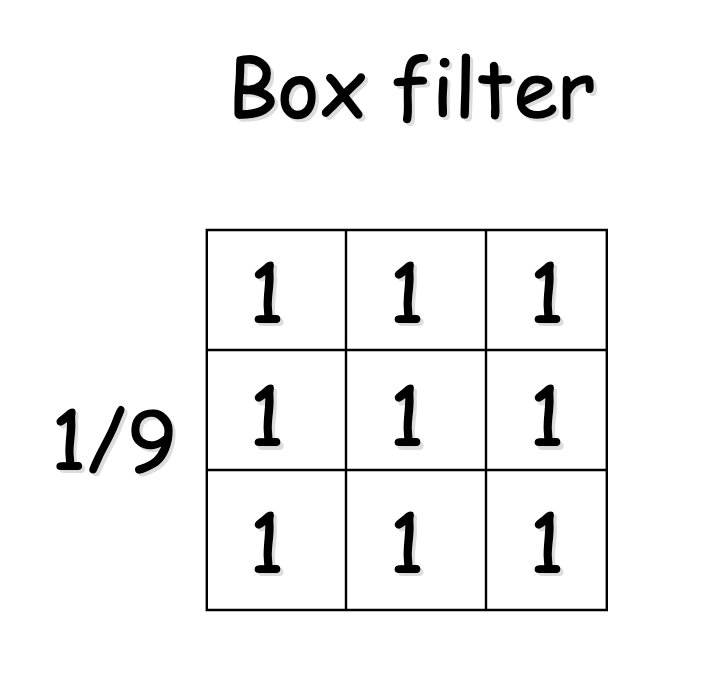

With this type of filters, if we need to calculate the filtered pixel in the position (x,y), we will need to calculate the product of the pixels in the positions (x-1,y-1)+(x,y-1)+(x+1,y-1)+(x-1,y)+(x,y)+(x+1,y)+(x-1,y+1)+(x,y+1)+(x+1,y1+1), against the filter mask.

Things to take care:

* The algorithm must be independent of the image size
* The values will been between 0 an 255, and the results should be integer values between those values.
* To calculate the borders, we uses the next available value. For example: if y is the row, for the upper border (where y=0) we will replace (x-1,y)+(x,y)+(x+1,y)+(x-1,y)+(x,y)+(x+1,y)+(x-1,y+1)+(x,y+1)+(x+1,y1+1).
* The images have 3 layers depth, so, we need to apply to each one of the 3 layers the filter mask

You will have 2 matrices: Image and Filter. The first one will be a preloaded image, the second matrix is the filter mask.

Things to do before starts:
* Which information you will distribute? Pixel position? row position? column position?
* Which information will you collect? Pixel, columns? rows?
* How will you collect the information?


In [8]:
image=np.array(Image.open('cat.jpg'))

In [9]:
filter_mask=np.ones((3,3))/9
print(filter_mask)

[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


In [10]:
print(image.shape)

(1200, 1600, 3)


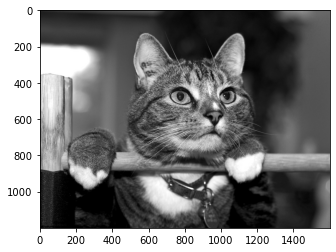

In [11]:
plt.figure()
plt.imshow(image)

In [12]:
def filter_image(my_image):
    shape=my_image.shape
    rows=shape[0]
    v=range(rows)
    with mp.Pool(NUMCORES,initializer=my.init_globalimage,initargs=[image,filter_mask]) as p:
        result=p.map(my.parallel_filtering_image,v)
    return result

In [13]:
%%time
filtered_image=filter_image(image)

CPU times: total: 297 ms
Wall time: 27.8 s


In [14]:
def reconstruct_image(shape,image):
    new_image=np.ndarray(shape,dtype=np.uint8)
    for r in range(len(image)):
        new_image[r]=image[r]
    return new_image

In [15]:
fimage=reconstruct_image(image.shape,filtered_image)

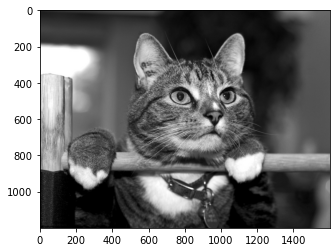

In [16]:
plt.figure()
plt.imshow(fimage)

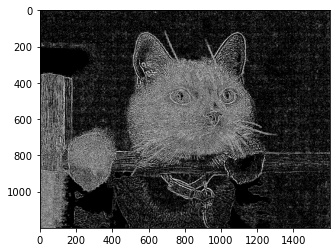

In [17]:
plt.figure()
plt.imshow(image-fimage)

In [ ]:
# Conclusion 
#CPU times: total: 109 ms
# Wall time: 32.8 s
#The wall time to apply the filter on the image is rather slow with around 30s 
# The filter blured out the original image and made it slightly more smooth
# After subtracting the filtered image from the original image shows the left over of the filtering
# Here we can see the detail of the filter in which it filtered the original image